# Unit 12 - Tales from the Crypto

---


## 1. Sentiment Analysis

Use the [newsapi](https://newsapi.org/) to pull the latest news articles for Bitcoin and Ethereum and create a DataFrame of sentiment scores for each coin.

Use descriptive statistics to answer the following questions:
1. Which coin had the highest mean positive score?
2. Which coin had the highest negative score?
3. Which coin had the highest positive score?

In [1]:
# Initial imports
import os
import pandas as pd
from dotenv import load_dotenv
import nltk as nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()


%matplotlib inline

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
# Read your api key environment variable
# YOUR CODE HERE!
api_key = os.getenv('news_api_key')

In [3]:
# Create a newsapi client
# YOUR CODE HERE!
from newsapi import NewsApiClient
newsapi = NewsApiClient(api_key=api_key)

In [4]:
# Fetch the Bitcoin news articles
# YOUR CODE HERE!

btc_news_en = newsapi.get_everything(
    q="bitcoin",
    language="en"
)

# Show the total number of news
btc_news_en["totalResults"]

7174

In [5]:
# Fetch the Ethereum news articles
# YOUR CODE HERE!

eth_news_en = newsapi.get_everything(
    q="ethereum",
    language="en"
)

# Show the total number of news
eth_news_en["totalResults"]

2417

In [6]:
# Create function for DataFrame

# This particular function creates a DataFrame, while including sentiment scores

def sentiment_df(news):
    articles = []
    for article in news["articles"]:
        try:
            title = article["title"]
            description = article["description"]
            text = article["content"]
            date = article["publishedAt"][:10]
            sentiment = analyzer.polarity_scores(str(title)+" "+str(description) +" "+ str(title))
            compound = sentiment["compound"]
            pos = sentiment["pos"]
            neu = sentiment["neu"]
            neg = sentiment["neg"]

            articles.append({
                "title": title,
                "description": description,
                "text": text,
                "date": date,
                "compound": compound,
                "positive": pos,
                "negative": neg,
                "neutral": neu
            })
        except AttributeError:
            pass

    return pd.DataFrame(articles)

In [7]:
# Create the Bitcoin sentiment scores DataFrame
# YOUR CODE HERE!
bitcoin_sentiment_df = sentiment_df(btc_news_en)


# Describe the Bitcoin Sentiment
# YOUR CODE HERE!
bitcoin_sentiment_df.describe()

,compound,positive,negative,neutral
count,20.000000,20.000000,20.000000,20.000000
mean,0.072810,0.078500,0.075150,0.846450
std,0.570949,0.071376,0.085611,0.098991
min,-0.880700,0.000000,0.000000,0.626000
25%,-0.317450,0.000000,0.000000,0.785250
50%,0.084000,0.063500,0.045500,0.831500
75%,0.646075,0.134500,0.149750,0.935500
max,0.822000,0.213000,0.236000,1.000000


In [8]:
# # Here we are working out the BTC sentiment scores and putting them into a DataFrame


# # BTC Sentiment scores dictionaries
# btc_title_sent = {
#     "title_compound": [],
#     "title_pos": [],
#     "title_neu": [],
#     "title_neg": [],
#     "title_sent": [],
# }
# btc_text_sent = {
#     "text_compound": [],
#     "text_pos": [],
#     "text_neu": [],
#     "text_neg": [],
#     "text_sent": [],
# }
# # Get sentiment for the text and the title
# for index, row in btc_df.iterrows():
#     try:
#         # Create sentiment score for title
#         title_sentiment = analyzer.polarity_scores(row["title"])
#         btc_title_sent["title_compound"].append(title_sentiment["compound"])
#         btc_title_sent["title_pos"].append(title_sentiment["pos"])
#         btc_title_sent["title_neu"].append(title_sentiment["neu"])
#         btc_title_sent["title_neg"].append(title_sentiment["neg"])
#         btc_title_sent["title_sent"].append(get_sentiment(title_sentiment["compound"]))
#         # Create sentiment score for body text
#         text_sentiment = analyzer.polarity_scores(row["text"])
#         btc_text_sent["text_compound"].append(text_sentiment["compound"])
#         btc_text_sent["text_pos"].append(text_sentiment["pos"])
#         btc_text_sent["text_neu"].append(text_sentiment["neu"])
#         btc_text_sent["text_neg"].append(text_sentiment["neg"])
#         btc_text_sent["text_sent"].append(get_sentiment(text_sentiment["compound"]))
#     except AttributeError:
#         pass

# # Create the Bitcoin sentiment scores DataFrame
# # YOUR CODE HERE!

# bitcoin_sentiment_df = create_sentiment_df(btc_news_en)


# # Describe the Bitcoin Sentiment
# # YOUR CODE HERE!
# bitcoin_sentiment_df.describe()

In [9]:
# Create the Ethereum sentiment scores DataFrame
# YOUR CODE HERE!
ethereum_sentiment_df = sentiment_df(eth_news_en)


# Describe the Ethereum Sentiment
# YOUR CODE HERE!
ethereum_sentiment_df.describe()

,compound,positive,negative,neutral
count,20.000000,20.000000,20.000000,20.000000
mean,0.331465,0.082500,0.028200,0.889300
std,0.530319,0.065625,0.061184,0.082147
min,-0.928700,0.000000,0.000000,0.674000
25%,0.000000,0.000000,0.000000,0.842750
50%,0.526700,0.090500,0.000000,0.889500
75%,0.745975,0.131500,0.030500,0.931750
max,0.904200,0.206000,0.250000,1.000000


### Questions:

Q: Which coin had the highest mean positive score?

A: ------- bitcoin

Q: Which coin had the highest compound score?

A: ------- Ethereum

Q. Which coin had the highest positive score?

A: ------- Bitcoin

---

## 2. Natural Language Processing
---
###   Tokenizer

In this section, you will use NLTK and Python to tokenize the text for each coin. Be sure to:
1. Lowercase each word.
2. Remove Punctuation.
3. Remove Stopwords.

In [10]:
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from string import punctuation
import re

In [11]:
# Instantiate the lemmatizer
# YOUR CODE HERE!
lemmatizer = WordNetLemmatizer()

# Create a list of stopwords
# YOUR CODE HERE!
sw = set(stopwords.words('english'))
regex = re.compile("[^a-zA-Z ]")

# Expand the default stopwords list if necessary
# YOUR CODE HERE!
sw_addon = {'said', 'an', 'ma', 'y', 'exp', '...','ect', 'did', 'of', 'char'}

In [12]:
# Complete the tokenizer function
def tokenizer(text):
    """Tokenizes text."""
    
    # Substitute everything that is NOT a letter with empty string
    text = regex.sub('', text)
    
    # Create a tokenized list of the words
    tokens = word_tokenize(text)
    
    # Remove the punctuation from text
    tokens = [word for word in tokens if word.lower() not in punctuation]    
    
    
    # Lemmatize words into root words
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
   
    # Convert the words to lowercase
    tokens = [word.lower() for word in tokens]
    
    # Remove the stop words
    # Substitute everything that is NOT a letter with empty string
    tokens = [word.lower() for word in tokens if word.lower() not in sw.union(sw_addon)]
    
    return tokens

In [13]:
# Create a new tokens column for Bitcoin
# YOUR CODE HERE!
bitcoin_sentiment_df["tokens"] = bitcoin_sentiment_df.apply(lambda row: tokenizer(row["title"]+" "+row["description"]+" "+row["text"]), axis=1)
bitcoin_sentiment_df.head()

,title,description,text,date,compound,positive,negative,neutral,tokens
0,A Field Guide for Nature-Resistant Nerds,"Yes, yes, the dirt is horrifying. But it’s als...",When my wife started a little garden in our ur...,2021-08-06,-0.0900,0.133,0.146,0.721,"[field, guide, natureresistant, nerds, yes, ye..."
1,Why Not Use Self-Driving Cars as Supercomputers?,Autonomous vehicles use the equivalent of 200 ...,"Like Dogecoin devotees, the mayor of Reno, and...",2021-07-19,0.1680,0.043,0.000,0.957,"[use, selfdriving, cars, supercomputers, auton..."
2,Daily Crunch: Bitcoin ‘is a big part of our fu...,"Hello friends and welcome to Daily Crunch, bri...",To get a roundup of TechCrunchs biggest and mo...,2021-07-23,0.8016,0.151,0.000,0.849,"[daily, crunch, bitcoin, big, part, future, sa..."
3,Crypto startup Phantom banks funding from Andr...,While retail investors grew more comfortable b...,While retail investors grew more comfortable b...,2021-07-14,0.7264,0.086,0.000,0.914,"[crypto, startup, phantom, bank, funding, andr..."
4,Michael Arrington’s next act,"As longtime TechCrunch readers know well, Mich...","As longtime TechCrunch readers know well, Mich...",2021-07-21,0.2732,0.066,0.000,0.934,"[michael, arringtons, next, act, longtime, tec..."


In [14]:
# Create a new tokens column for Ethereum
# YOUR CODE HERE!
ethereum_sentiment_df["tokens"] = ethereum_sentiment_df.apply(lambda row: tokenizer(row["title"]+" "+row["description"]+" "+row["text"]), axis=1)
ethereum_sentiment_df.head()

,title,description,text,date,compound,positive,negative,neutral,tokens
0,"Crypto investors like Terraform Labs so much, ...",There are many blockchain platforms competing ...,There are many blockchain platforms competing ...,2021-07-16,0.8238,0.142,0.000,0.858,"[crypto, investor, like, terraform, labs, much..."
1,Tenderly raises $15.3M to help Ethereum develo...,Blockchain infrastructure startups are heating...,Blockchain infrastructure startups are heating...,2021-07-29,0.8417,0.160,0.028,0.812,"[tenderly, raise, help, ethereum, developer, s..."
2,Crypto startup Phantom banks funding from Andr...,While retail investors grew more comfortable b...,While retail investors grew more comfortable b...,2021-07-14,0.7264,0.086,0.000,0.914,"[crypto, startup, phantom, bank, funding, andr..."
3,"Cent, the platform that Jack Dorsey used to se...",Cent was founded in 2017 as an ad-free creator...,Cent was founded in 2017 as an ad-free creator...,2021-08-05,0.8047,0.123,0.000,0.877,"[cent, platform, jack, dorsey, used, sell, fir..."
4,Ethereum major upgrade activated; ether stays ...,"A major software upgrade on Ethereum, the seco...",Representation of the Ethereum virtual currenc...,2021-08-05,-0.5267,0.000,0.089,0.911,"[ethereum, major, upgrade, activated, ether, s..."


---

### NGrams and Frequency Analysis

In this section you will look at the ngrams and word frequency for each coin. 

1. Use NLTK to produce the n-grams for N = 2. 
2. List the top 10 words for each coin. 

In [15]:
from collections import Counter
from nltk import ngrams

In [16]:
# Generate the Bitcoin N-grams where N=2
# YOUR CODE HERE!
bitcoin_sentiment_df["n-gram"] = bitcoin_sentiment_df.apply(lambda row: Counter(ngrams(row["tokens"], n=2)), axis=1)
bitcoin_sentiment_df.head()

,title,description,text,date,compound,positive,negative,neutral,tokens,n-gram
0,A Field Guide for Nature-Resistant Nerds,"Yes, yes, the dirt is horrifying. But it’s als...",When my wife started a little garden in our ur...,2021-08-06,-0.0900,0.133,0.146,0.721,"[field, guide, natureresistant, nerds, yes, ye...","{('field', 'guide'): 1, ('guide', 'natureresis..."
1,Why Not Use Self-Driving Cars as Supercomputers?,Autonomous vehicles use the equivalent of 200 ...,"Like Dogecoin devotees, the mayor of Reno, and...",2021-07-19,0.1680,0.043,0.000,0.957,"[use, selfdriving, cars, supercomputers, auton...","{('use', 'selfdriving'): 1, ('selfdriving', 'c..."
2,Daily Crunch: Bitcoin ‘is a big part of our fu...,"Hello friends and welcome to Daily Crunch, bri...",To get a roundup of TechCrunchs biggest and mo...,2021-07-23,0.8016,0.151,0.000,0.849,"[daily, crunch, bitcoin, big, part, future, sa...","{('daily', 'crunch'): 3, ('crunch', 'bitcoin')..."
3,Crypto startup Phantom banks funding from Andr...,While retail investors grew more comfortable b...,While retail investors grew more comfortable b...,2021-07-14,0.7264,0.086,0.000,0.914,"[crypto, startup, phantom, bank, funding, andr...","{('crypto', 'startup'): 1, ('startup', 'phanto..."
4,Michael Arrington’s next act,"As longtime TechCrunch readers know well, Mich...","As longtime TechCrunch readers know well, Mich...",2021-07-21,0.2732,0.066,0.000,0.934,"[michael, arringtons, next, act, longtime, tec...","{('michael', 'arringtons'): 1, ('arringtons', ..."


In [17]:
# Generate the Ethereum N-grams where N=2
# YOUR CODE HERE!
ethereum_sentiment_df["n-gram"] = ethereum_sentiment_df.apply(lambda row: Counter(ngrams(row["tokens"], n=2)), axis=1)
ethereum_sentiment_df.head()

,title,description,text,date,compound,positive,negative,neutral,tokens,n-gram
0,"Crypto investors like Terraform Labs so much, ...",There are many blockchain platforms competing ...,There are many blockchain platforms competing ...,2021-07-16,0.8238,0.142,0.000,0.858,"[crypto, investor, like, terraform, labs, much...","{('crypto', 'investor'): 1, ('investor', 'like..."
1,Tenderly raises $15.3M to help Ethereum develo...,Blockchain infrastructure startups are heating...,Blockchain infrastructure startups are heating...,2021-07-29,0.8417,0.160,0.028,0.812,"[tenderly, raise, help, ethereum, developer, s...","{('tenderly', 'raise'): 1, ('raise', 'help'): ..."
2,Crypto startup Phantom banks funding from Andr...,While retail investors grew more comfortable b...,While retail investors grew more comfortable b...,2021-07-14,0.7264,0.086,0.000,0.914,"[crypto, startup, phantom, bank, funding, andr...","{('crypto', 'startup'): 1, ('startup', 'phanto..."
3,"Cent, the platform that Jack Dorsey used to se...",Cent was founded in 2017 as an ad-free creator...,Cent was founded in 2017 as an ad-free creator...,2021-08-05,0.8047,0.123,0.000,0.877,"[cent, platform, jack, dorsey, used, sell, fir...","{('cent', 'platform'): 1, ('platform', 'jack')..."
4,Ethereum major upgrade activated; ether stays ...,"A major software upgrade on Ethereum, the seco...",Representation of the Ethereum virtual currenc...,2021-08-05,-0.5267,0.000,0.089,0.911,"[ethereum, major, upgrade, activated, ether, s...","{('ethereum', 'major'): 1, ('major', 'upgrade'..."


In [18]:
# Function token_count generates the top 10 words for a given coin
def token_count(tokens, N=3):
    """Returns the top N tokens from the frequency count"""
    return Counter(tokens).most_common(N)

In [19]:
# Use token_count to get the top 10 words for Bitcoin
# YOUR CODE HERE!
bitcoin_top_10 = token_count(bitcoin_sentiment_df["tokens"].sum(), 10)

print(pd.DataFrame(bitcoin_top_10, columns=['Top 10 words', 'count']).set_index('Top 10 words'))

                  count
Top 10 words           
bitcoin              34
reuters              14
attack                8
wa                    7
tesla                 7
company               7
cryptocurrency        6
cryptocurrencies      6
musk                  6
reutersdado           6


In [20]:
# Use token_count to get the top 10 words for Ethereum
# YOUR CODE HERE!
ethereum_top_10 = token_count(ethereum_sentiment_df["tokens"].sum(), 10)

print(pd.DataFrame(ethereum_top_10, columns=['Top 10 words', 'count']).set_index('Top 10 words'))

                count
Top 10 words         
ethereum           34
reuters            13
blockchain         11
bitcoin            11
crypto             10
network            10
ether              10
like                8
ha                  8
cryptocurrency      8


---

### Word Clouds

In this section, you will generate word clouds for each coin to summarize the news for each coin

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [20.0, 10.0]

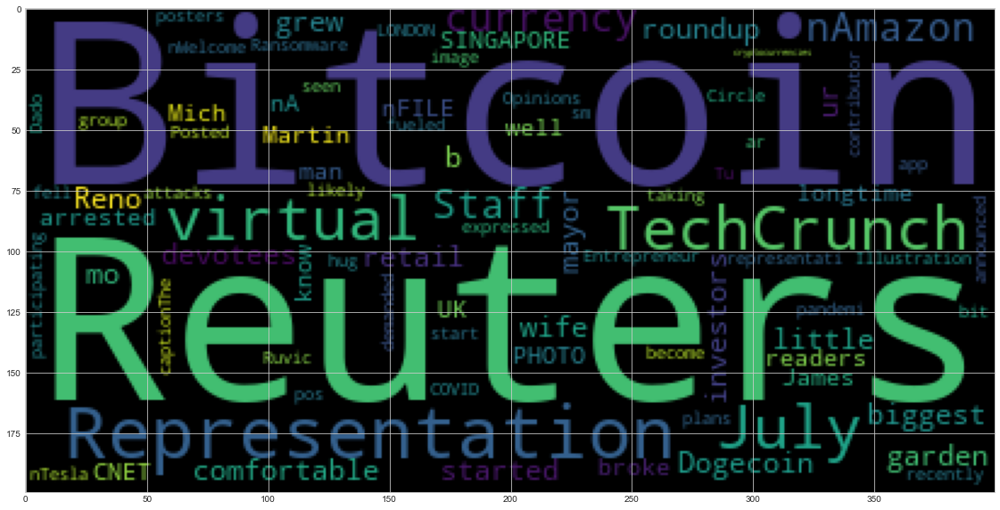

In [22]:
# Generate the Bitcoin word cloud
# YOUR CODE HERE!
btc_wc = WordCloud().generate(bitcoin_sentiment_df["text"].to_string())
plt.imshow(btc_wc)

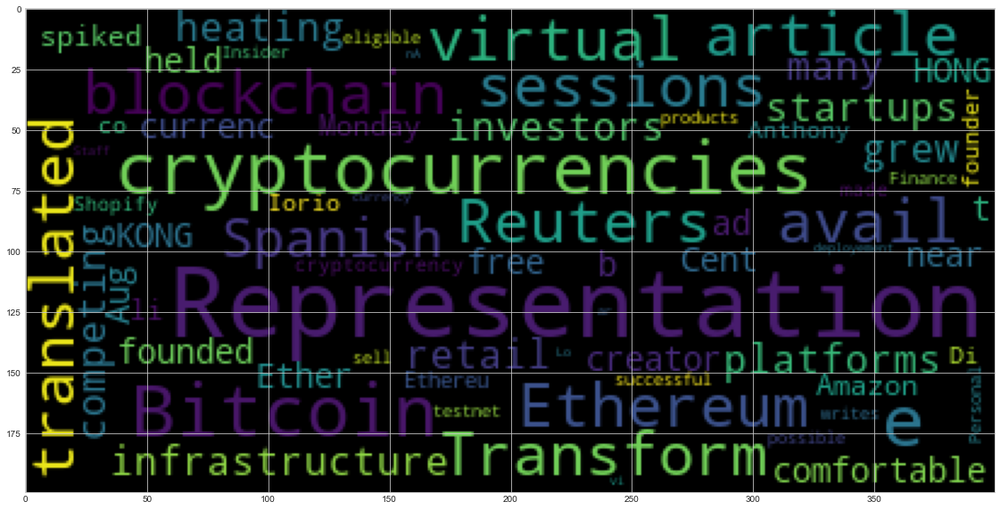

In [23]:
# Generate the Ethereum word cloud
# YOUR CODE HERE!
eth_wc = WordCloud().generate(ethereum_sentiment_df["text"].to_string())
plt.imshow(eth_wc)

---
## 3. Named Entity Recognition

In this section, you will build a named entity recognition model for both Bitcoin and Ethereum, then visualize the tags using SpaCy.

In [24]:
# Import spaCy, reuters, displacy
import spacy
from nltk.corpus import reuters
from spacy import displacy


In [25]:
# xDownload the language model for SpaCy
#!python -m spacy download en_core_web_sms

In [26]:
# Load the spaCy model
nlp = spacy.load('en_core_web_sm')

---
### Bitcoin NER

In [27]:
# Concatenate all of the Bitcoin text together
# YOUR CODE HERE!
bitcoin_big_string = ' '.join(bitcoin_sentiment_df["title"]).join(bitcoin_sentiment_df["title"]).join(bitcoin_sentiment_df["title"])

In [28]:
# Run the NER processor on all of the text
# YOUR CODE HERE!
bitcoin_ner = nlp(bitcoin_big_string)

# Add a title to the document
# YOUR CODE HERE!
bitcoin_ner.user_data["title"] = "Bitcoin NER"

In [29]:
# Render the visualization
# YOUR CODE HERE!
# doc = btc_df["text"].to_string()
# displacy.render(doc, style='ent')

In [30]:
# Render the visualization
# YOUR CODE HERE!
displacy.render(bitcoin_ner, style='ent')

In [31]:
# List all Entities
# YOUR CODE HERE!
for ent in bitcoin_ner.ents:
    print(ent.text, ent.label_)

Field Guide PERSON
Field Guide PERSON
Twitter PERSON
Jack Dorsey Crypto PERSON
Phantom ORG
Andreessen Horowitz FAC
Michael Arrington’s PERSON
above $40000 MONEY
Reuters ORG
UK GPE
Twitter PRODUCT
Biden PERSON
Musk PERSON
2020 DATE
over $30000 MONEY
over $30,000 MONEY
Musk - Reuters PERSON
30000 MONEY
first ORDINAL
month DATE
Amazon ORG
DeFi GPE
Pantera Capital - ReutersWhy Not Use Self-Driving Cars ORG
Twitter PERSON
Jack Dorsey Crypto PERSON
Phantom ORG
Andreessen Horowitz FAC
Michael Arrington’s PERSON
above $40000 MONEY
Reuters ORG
UK GPE
Twitter PRODUCT
Biden PERSON
Musk PERSON
2020 DATE
over $30000 MONEY
over $30,000 MONEY
Musk - Reuters PERSON
30000 MONEY
first ORDINAL
month DATE
Amazon ORG
DeFi GPE
Pantera Capital - ReutersDaily Crunch ORG
Twitter PERSON
Jack PERSON
Field Guide for Nature-Resistant Nerds Why Not Use Self-Driving Cars as Supercomputers ORG
Twitter PERSON
Jack Dorsey Crypto PERSON
Phantom ORG
Andreessen Horowitz FAC
Michael Arrington’s PERSON
above $40000 MONEY
Re

---

### Ethereum NER

In [32]:
# Concatenate all of the Ethereum text together
# YOUR CODE HERE!
ethereum_big_string = ' '.join(ethereum_sentiment_df["title"]).join(ethereum_sentiment_df["title"]).join(ethereum_sentiment_df["title"])

In [33]:
# Run the NER processor on all of the text
# YOUR CODE HERE!
ethereum_ner = nlp(ethereum_big_string)

# Add a title to the document
# YOUR CODE HERE!
ethereum_ner.user_data["title"] = "Ethereum NER"

In [34]:
# Render the visualization
# YOUR CODE HERE!
displacy.render(ethereum_ner, style='ent')

In [35]:
# List all Entities
# YOUR CODE HERE!
for ent in ethereum_ner.ents:
    print(ent.text, ent.label_)

Crypto ORG
Terraform Labs ORG
$150 million MONEY
Terraform Labs ORG
$150 million MONEY
Terraform Labs ORG
$150 million MONEY
15.3 MONEY
Ethereum PERSON
Crypto ORG
Phantom ORG
Andreessen Horowitz FAC
Jack Dorsey PERSON
first ORDINAL
NFT ORG
$3M MONEY
two-month DATE
DeFi GPE
Pantera Capital - Reuters ORG
Ethereum PERSON
Reuters ORG
$20M MONEY
Meet Xoycoin PERSON
Mexican NORP
Ethereum PERSON
20 CARDINAL
BlockFi PERSON
Brazil GPE
first ORDINAL
Latin America LOC
Ether Ethereum PERSON
Polygon Studio PERSON
$100M MONEY
NFT ORG
Fed ORG
Powell PERSON
Tether ORG
Bloomberg News - Reuters Tesla ORG
Musk - ReutersTenderly PERSON
15.3 MONEY
Ethereum PERSON
Terraform Labs ORG
$150 million MONEY
15.3 MONEY
Ethereum PERSON
Crypto ORG
Phantom ORG
Andreessen Horowitz FAC
Jack Dorsey PERSON
first ORDINAL
NFT ORG
$3M MONEY
two-month DATE
DeFi GPE
Pantera Capital - Reuters ORG
Ethereum PERSON
Reuters ORG
$20M MONEY
Meet Xoycoin PERSON
Mexican NORP
Ethereum PERSON
20 CARDINAL
BlockFi PERSON
Brazil GPE
first 

---